# 二項分布モデルでのP値函数のグラフ

* 黒木玄
* 2020-10-17
$
\newcommand\op{\operatorname}
\newcommand\pdf{\op{pdf}}
\newcommand\cdf{\op{cdf}}
\newcommand\ccdf{\op{ccdf}}
\newcommand\quantile{\op{quantile}}
\newcommand\cquantile{\op{cquantile}}
\newcommand\pvalue{\op{pvalue}}
\newcommand\confint{\op{confint}}
\newcommand\credint{\op{credint}}
$

<h1>目次<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#WilsonのP値函数の場合" data-toc-modified-id="WilsonのP値函数の場合-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>WilsonのP値函数の場合</a></span></li><li><span><a href="#WilsonのP値函数とClopper-PeasonのP値函数とベイズ版P値函数の比較" data-toc-modified-id="WilsonのP値函数とClopper-PeasonのP値函数とベイズ版P値函数の比較-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>WilsonのP値函数とClopper-PeasonのP値函数とベイズ版P値函数の比較</a></span></li><li><span><a href="#highest-density-interval-版のP値函数" data-toc-modified-id="highest-density-interval-版のP値函数-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>highest density interval 版のP値函数</a></span></li><li><span><a href="#信頼区間にベイズ信用区間と同様の意味で「真の値」が含まれる確率" data-toc-modified-id="信頼区間にベイズ信用区間と同様の意味で「真の値」が含まれる確率-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>信頼区間にベイズ信用区間と同様の意味で「真の値」が含まれる確率</a></span></li><li><span><a href="#ベイズ信用区間の信頼区間と同様の意味での被覆確率" data-toc-modified-id="ベイズ信用区間の信頼区間と同様の意味での被覆確率-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>ベイズ信用区間の信頼区間と同様の意味での被覆確率</a></span></li><li><span><a href="#P値とBayes因子の比較" data-toc-modified-id="P値とBayes因子の比較-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>P値とBayes因子の比較</a></span><ul class="toc-item"><li><span><a href="#P値とBayes因子の関係の導出" data-toc-modified-id="P値とBayes因子の関係の導出-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>P値とBayes因子の関係の導出</a></span></li><li><span><a href="#Bayes-factor経由で計算したP値と通常のP値の比較" data-toc-modified-id="Bayes-factor経由で計算したP値と通常のP値の比較-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Bayes factor経由で計算したP値と通常のP値の比較</a></span></li><li><span><a href="#一定のBayes因子に対応するP値の値の漸近挙動" data-toc-modified-id="一定のBayes因子に対応するP値の値の漸近挙動-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>一定のBayes因子に対応するP値の値の漸近挙動</a></span></li><li><span><a href="#一般の事前分布の場合に関する補足" data-toc-modified-id="一般の事前分布の場合に関する補足-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>一般の事前分布の場合に関する補足</a></span></li></ul></li></ul></div>

In [1]:
using Distributions
using Optim
using Roots
using StatsPlots
default(fmt=:png,
    titlefontsize=10, tickfontsize=6, guidefontsize=9, legendfontsize=9)

## WilsonのP値函数の場合

In [2]:
function pvalue_bin_wilson(k, p; n=20)
    z = (k - n*p)/√(n*p*(1 - p))
    2ccdf(Normal(), abs(z))
end

# Wilsonの信頼区間
function confint_bin_wilson(k; n=20, α=0.05)
    z = cquantile(Normal(0,1), α/2)
    p̂ = k/n
    a, b, c = 1 + z^2/n, p̂ + z^2/(2n), p̂^2
    sqrtD = √(b^2 - a*c)
    (b - sqrtD)/a, (b + sqrtD)/a
end

confint_bin_wilson (generic function with 1 method)

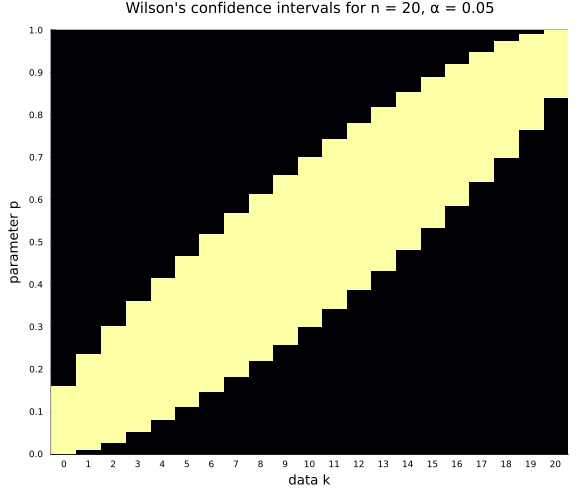

In [3]:
n = 20
α = 0.05
x = range(-0.5, n+0.5, 500)
p = range(0, 1, 500)
heatmap(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n) ≥ α;
    clim=(0, 1), colorbar=false)
plot!(xguide="data k", yguide="parameter p")
plot!(xtick=0:n, ytick=0:0.1:1)
title!("Wilson's confidence intervals for n = $n, α = $α")
plot!(size=(580, 500))

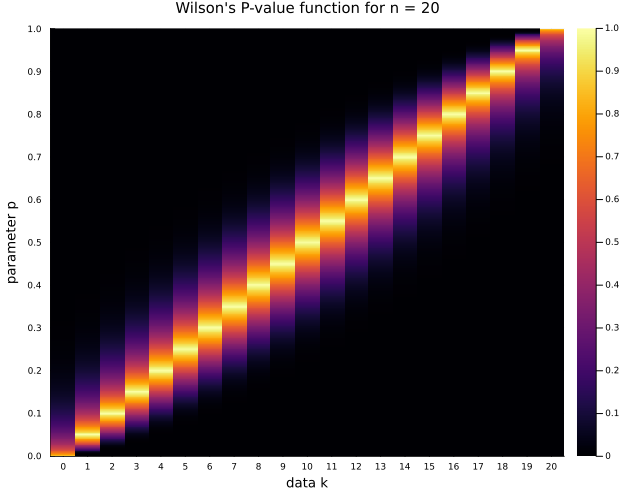

In [4]:
n = 20
x = range(-0.5, n+0.5, 500)
p = range(0, 1, 500)
heatmap(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); clim=(0, 1))
plot!(xguide="data k", yguide="parameter p")
plot!(xtick=0:n, ytick=0:0.1:1)
title!("Wilson's P-value function for n = $n")
plot!(size=(640, 500))

(p_L, p_U) = confint_bin_wilson(k; n) = (0.145477244867604, 0.518972818353524)


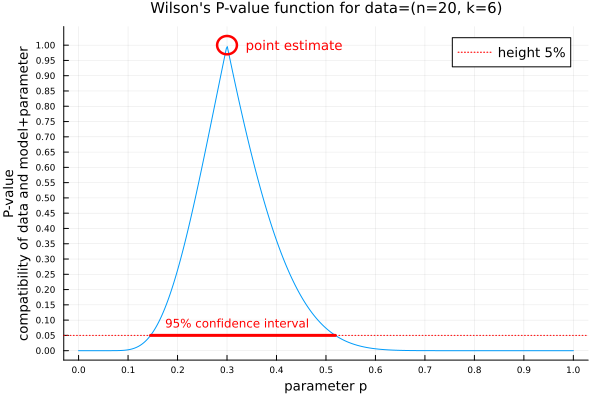

In [5]:
n, k = 20, 6
@show p_L, p_U = confint_bin_wilson(k; n)
p = range(0, 1, 500)
t = range(0, 2π, 100)
plot(p, p -> pvalue_bin_wilson(k, p; n); label="")
plot!([p_L, p_U], fill(0.05, 2); lw=3, c=:red, label="")
annotate!([(0.32, 0.09, ("95% confidence interval", 8, :center, :red))])
hline!([0.05]; ls=:dot, c=:red, label="height 5%")
plot!(@.(0.3+0.02cos(t)), @.(1+0.03sin(t)), lw=2.5, c=:red, label="")
annotate!([(0.34, 1.0, ("point estimate", 9, :left, :red))])
plot!(xguide="parameter p",
    yguide="P-value\ncompatibility of data and model+parameter")
plot!(xtick=0:0.1:1, ytick=0:0.05:1)
title!("Wilson's P-value function for data=(n=$n, k=$k)")

beta = Beta(k + 1, (n - k) + 1) = Beta{Float64}(α=7.0, β=15.0)
(p_L, p_U) = hdi(beta) = (0.13606948377291903, 0.5092998691378794)


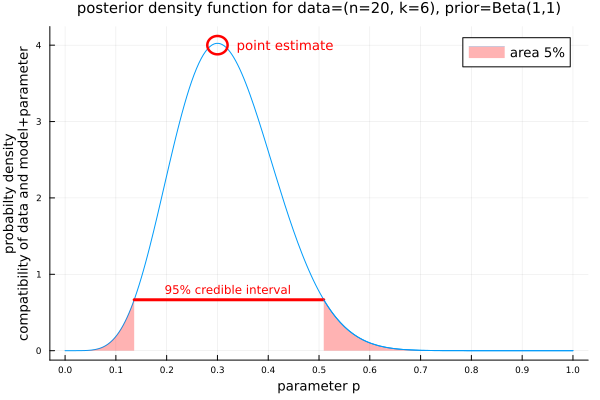

In [6]:
function hdi(dist::ContinuousUnivariateDistribution, α = 0.05; alg = Brent())
    f(p) = quantile(dist, p + (1 - α)) - quantile(dist, p)
    o = optimize(f, 0, α, alg)
    p = o.minimizer
    quantile.(dist, (p, p + (1 - α)))
end

n, k = 20, 6
@show beta = Beta(k+1, n-k+1)
@show p_L, p_U = hdi(beta)
t = range(0, 2π, 100)
plot(p -> pdf(beta, p), 0, 1; label="")
plot!([p_L, p_U], fill(pdf(beta, p_L), 2); lw=3, c=:red, label="")
annotate!([(0.32, 0.8, ("95% credible interval", 8, :center, :red))])
plot!(p -> pdf(beta, p), 0, p_L; label="area 5%", c=1, lw=0, fc=:red, fa=0.3, fillrange=0)
plot!(p -> pdf(beta, p), p_U, 1; label="", c=1, fc=:red, fa=0.3, fillrange=0)
plot!(@.(0.3+0.02cos(t)), @.(4+0.12sin(t)), lw=2.5, c=:red, label="")
annotate!([(0.34, 4.0, ("point estimate", 9, :left, :red))])
plot!(xguide="parameter p",
    yguide="probabilty density\ncompatibility of data and model+parameter")
plot!(xtick=0:0.1:1)
title!("posterior density function for data=(n=$n, k=$k), prior=Beta(1,1)")

beta = Beta(k + 1, (n - k) + 1) = Beta{Float64}(α=7.0, β=15.0)
(p_BCIL, p_BCIU) = hdi(beta) = (0.13606948377291903, 0.5092998691378794)
(p_CIL, p_CIU) = confint_bin_wilson(k; n) = (0.145477244867604, 0.518972818353524)


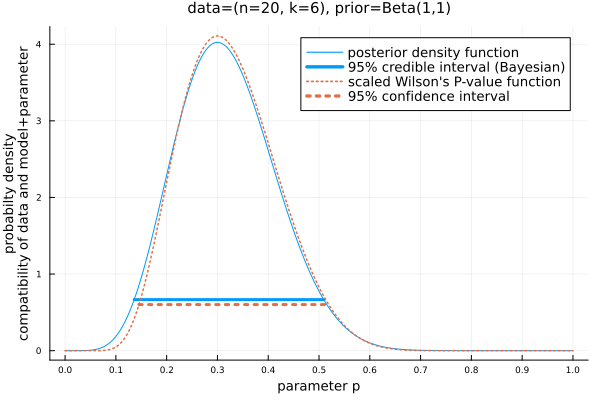

In [7]:
function pvalue2density(pval; n=20, k=6)
    z = quantile(Normal(), 1 - pval/2)
    pdf(Normal(), z) / std(Beta(k+1, n-k+1))
end

n, k = 20, 6
@show beta = Beta(k+1, n-k+1)
@show p_BCIL, p_BCIU = hdi(beta)
@show p_CIL, p_CIU = confint_bin_wilson(k; n)
p = range(0, 1, 500)
t = range(0, 2π, 100)
plot(p, p -> pdf(beta, p); c=1,
    label="posterior density function")
plot!([p_BCIL, p_BCIU], fill(pdf(beta, p_BCIL), 2); lw=3, c=1,
    label="95% credible interval (Bayesian)")
plot!(p, p -> pvalue2density(pvalue_bin_wilson(k, p; n); n, k); c=2,
    ls=:dot, lw=1.5, label="scaled Wilson's P-value function")
plot!([p_CIL, p_CIU], fill(pvalue2density(0.05; n, k), 2); lw=3, c=2,
    ls=:dot, label="95% confidence interval")
plot!(xguide="parameter p",
    yguide="probabilty density\ncompatibility of data and model+parameter")
plot!(xtick=0:0.1:1)
title!("data=(n=$n, k=$k), prior=Beta(1,1)")

beta = Beta(k + 1, (n - k) + 1) = Beta{Float64}(α=31.0, β=71.0)
(p_BCIL, p_BCIU) = hdi(beta) = (0.21655420755178248, 0.39343373939085347)
(p_CIL, p_CIU) = confint_bin_wilson(k; n) = (0.21894885294932742, 0.39584854633346683)


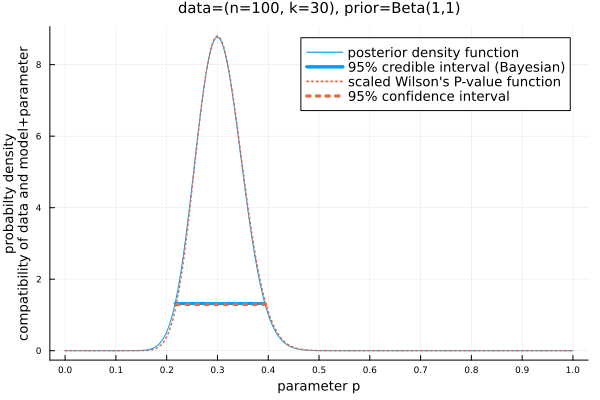

In [8]:
function pvalue2density(pval; n=20, k=6)
    z = quantile(Normal(), 1 - pval/2)
    pdf(Normal(), z) / std(Beta(k+1, n-k+1))
end

n, k = 100, 30
@show beta = Beta(k+1, n-k+1)
@show p_BCIL, p_BCIU = hdi(beta)
@show p_CIL, p_CIU = confint_bin_wilson(k; n)
p = range(0, 1, 500)
t = range(0, 2π, 100)
plot(p, p -> pdf(beta, p); c=1,
    label="posterior density function")
plot!([p_BCIL, p_BCIU], fill(pdf(beta, p_BCIL), 2); lw=3, c=1,
    label="95% credible interval (Bayesian)")
plot!(p, p -> pvalue2density(pvalue_bin_wilson(k, p; n); n, k); c=2,
    ls=:dot, lw=1.5, label="scaled Wilson's P-value function")
plot!([p_CIL, p_CIU], fill(pvalue2density(0.05; n, k), 2); lw=3, c=2,
    ls=:dot, label="95% confidence interval")
plot!(xguide="parameter p",
    yguide="probabilty density\ncompatibility of data and model+parameter")
plot!(xtick=0:0.1:1)
title!("data=(n=$n, k=$k), prior=Beta(1,1)")

 61.104912 seconds (37.31 M allocations: 1001.183 MiB, 0.28% gc time, 2.47% compilation time: 1% of which was recompilation)


[ Info: Saved animation to D:\OneDrive\public\0038\Wilson's P-value function n=20 (60).gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0038\\Wilson's P-value function n=20 (60).gif")
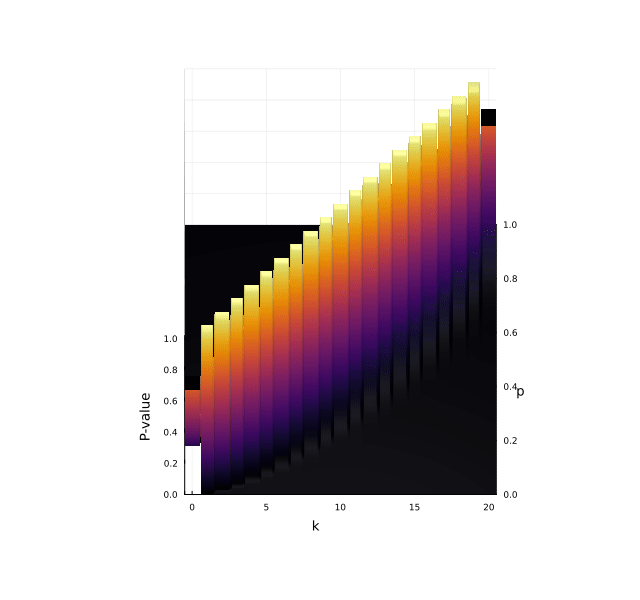

In [9]:
n = 20
x = range(-0.5, n+0.5, 211)
p = range(0, 1, 201)
@time anim = @animate for t in 0:3:359
    surface(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); colorbar=false, camera=(t, 60))
    plot!(xguide="k", yguide="p", zguide="P-value")
    plot!(size=(640, 600), zlim=(0, 1))
end
gif(anim, "Wilson's P-value function n=$n (60).gif")

 60.519792 seconds (31.63 M allocations: 688.099 MiB, 0.16% gc time, 0.04% compilation time)


[ Info: Saved animation to D:\OneDrive\public\0038\Wilson's P-value function n=20 (45).gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0038\\Wilson's P-value function n=20 (45).gif")
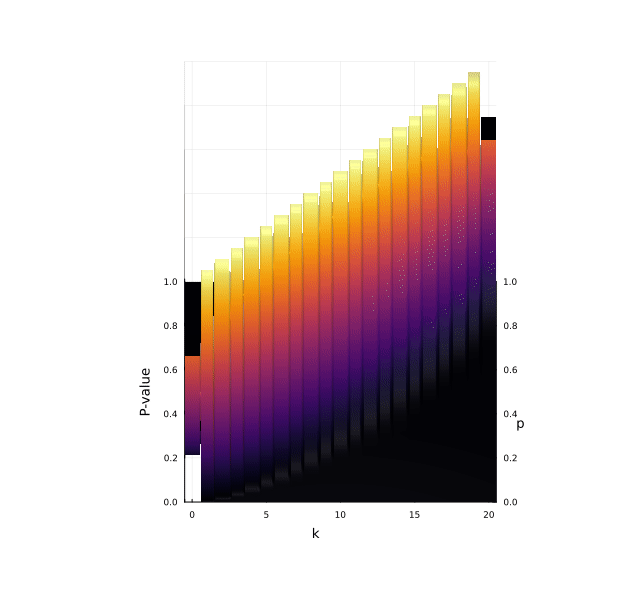

In [10]:
n = 20
x = range(-0.5, n+0.5, 211)
p = range(0, 1, 201)
@time anim = @animate for t in 0:3:359
    surface(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); colorbar=false, camera=(t, 45))
    plot!(xguide="k", yguide="p", zguide="P-value")
    plot!(size=(640, 600), zlim=(0, 1))
end
gif(anim, "Wilson's P-value function n=$n (45).gif")

## WilsonのP値函数とClopper-PeasonのP値函数とベイズ版P値函数の比較

In [11]:
safediv(x, y) = x==0 ? x : y==Inf ? zero(y) : x/y

# WilsonのP値函数
function pvalue_bin_wilson(k, p; n=20)
    z = safediv(k - n*p, √(n*p*(1 - p)))
    2ccdf(Normal(), abs(z))
end

# Clopper-PearsonのP値函数
function pvalue_bin_cp(k, p; n=20)
    bin = Binomial(n, p)
    min(1, 2cdf(bin, k), 2ccdf(bin, k-1))
end

# 事前分布Beta(γ, δ)によるBayes版のP値函数(equal-tailed interval版)
function pvalue_bin_bayesian_eti(k, p; n=20, γ=1, δ=1)
    beta = Beta(k+γ, n-k+δ)
    min(1, 2cdf(beta, p), 2ccdf(beta, p))
end

function plot_pvalue_functions(; n=20, k=6, γ=1, δ=1, kwargs...)
    p = range(0, 1, 500)
    plot(p, p -> pvalue_bin_wilson(k, p; n); label="Wilson")
    plot!(p, p -> pvalue_bin_cp(k, p; n); label="Clopper-Pearson", ls=:dash)
    plot!(p, p -> pvalue_bin_bayesian_eti(k, p; n, γ, δ); label="Bayesian (ETI)", ls=:dashdot)
    plot!(xguide="parameter p", yguide="P-value")
    plot!(xtick=0:0.1:1, ytick=0:0.1:1)
    title!("P-value functions for n=$n, k=$k, prior=Beta($γ, $δ)")
    plot!(; kwargs...)
end

plot_pvalue_functions (generic function with 1 method)

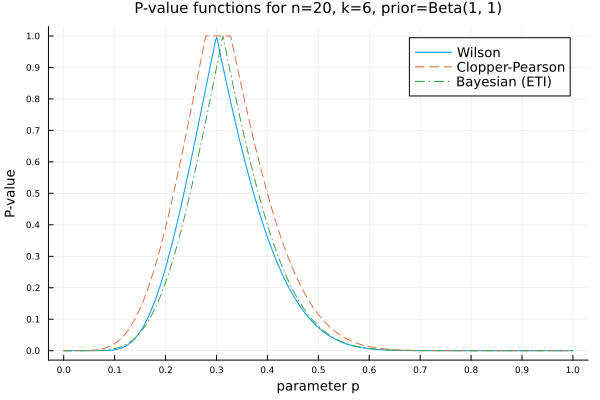

In [12]:
plot_pvalue_functions(; n=20, k=6, γ=1, δ=1)

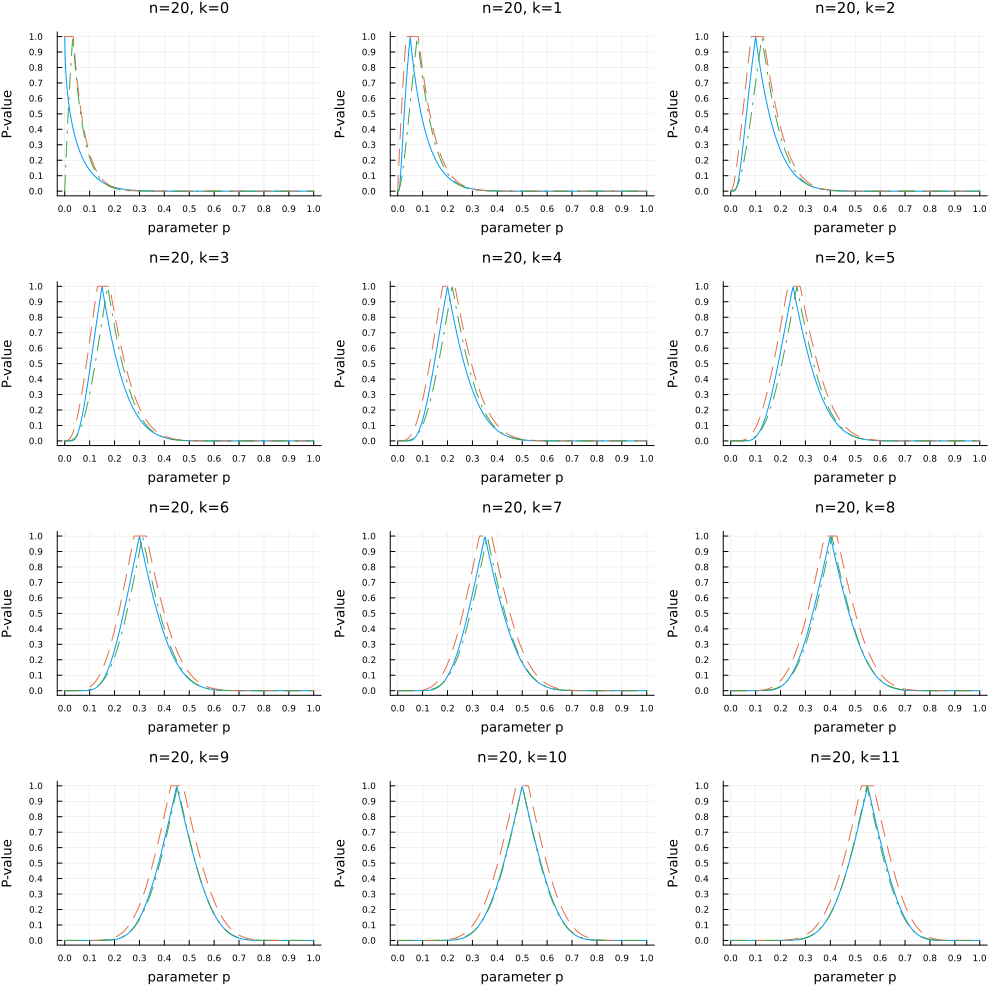

In [13]:
PP = []
for k in 0:11
    P = plot_pvalue_functions(; n=20, k, title="n=$n, k=$k", legend=false)
    push!(PP, P)
end
plot(PP...; size=(1000, 1000), layout=(4, 3))
plot!(legend=false)

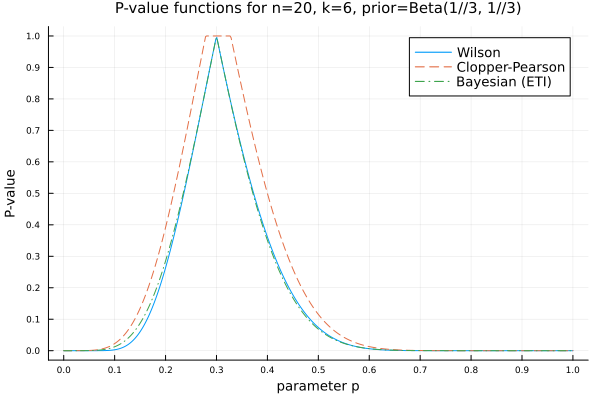

In [14]:
plot_pvalue_functions(; n=20, k=6, γ=1//3, δ=1//3)

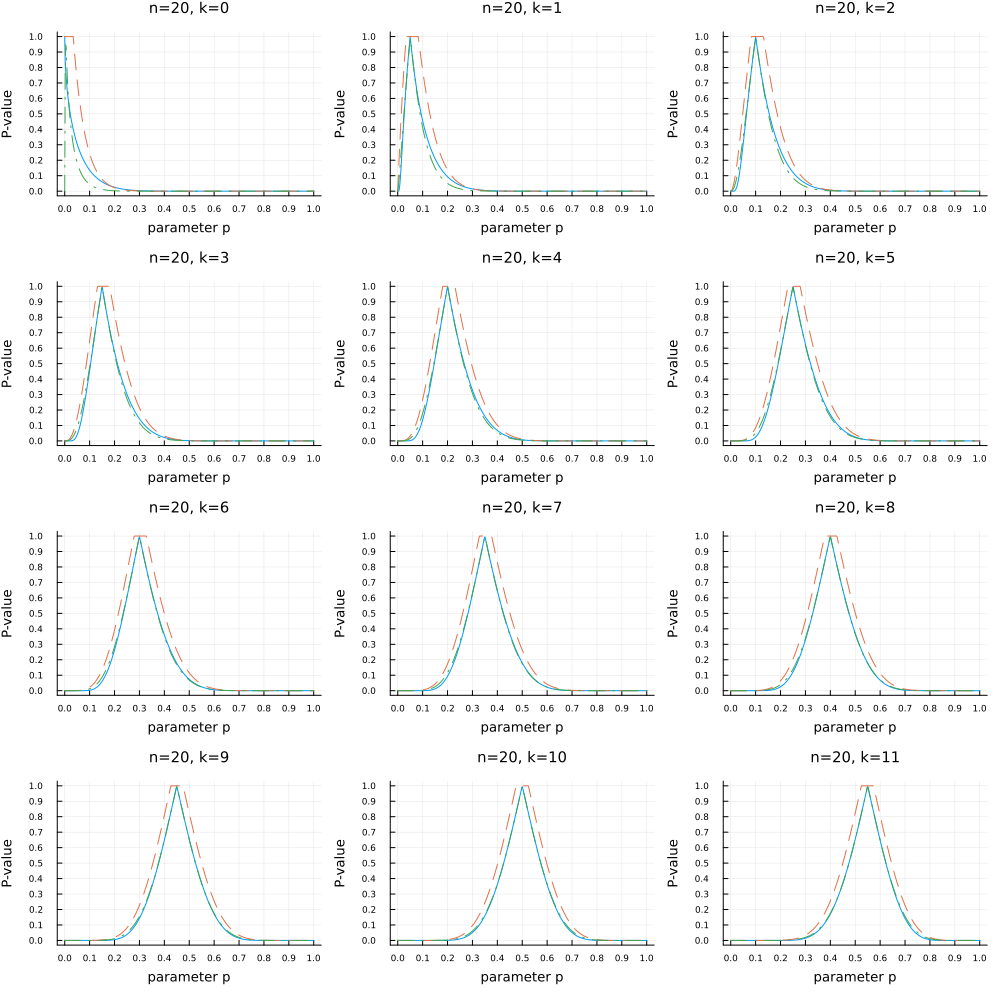

In [15]:
PP = []
for k in 0:11
    P = plot_pvalue_functions(; n=20, k, γ=1//3, δ=1//3, title="n=$n, k=$k", legend=false)
    push!(PP, P)
end
plot(PP...; size=(1000, 1000), layout=(4, 3))
plot!(legend=false)

## highest density interval 版のP値函数

事後分布 $\op{Beta}(k+\gamma, n-k+\delta)$ の累積分布函数と確率密度函数をそれぞれ

$$
\Psi(p) = \cdf(\op{Beta}(k+\gamma, n-k+\delta), p), \quad
\psi(p) = \pdf(\op{Beta}(k+\gamma, n-k+\delta), p)
$$

と書くとき, 仮説「成功確率は $p$ である」の highest density interval 版のP値が次のように定義される:

$$
\pvalue_{\op{Bayesian}\op{HDI}}(k|n,p,\gamma,\delta) = \Psi(p) + \Psi(p').
$$

ここで $p'$ は $\psi(p)=\psi(p')$ を満たす $p$ 以外のパラメータ値 $p'$ である.

このP値の定義に対応する区間

$$
\credint_{\op{Bayesian}\op{HDI}}(k|n,\alpha,\gamma,\delta) =
\{\, p\in[0,1] \mid \pvalue_{\op{Bayesian}\op{HDI}}(k|n,p,\gamma,\delta) \ge \alpha\,\}
$$

はhighest density interval 版の $100(1-\alpha)\%$ ベイズ信用区間, すなわち, 事後分布で測った確率が $1-\alpha$ になるようなパラメータの区間で長さが最短のものになる.

In [16]:
function pvalue_hdi(dist::ContinuousUnivariateDistribution, x₀; xlim = extrema(dist))
    p₀ = pdf(dist, x₀)
    m = mode(dist)
    f(x) = pdf(dist, x) - p₀
    if x₀ == m
        1.0
    elseif x₀ > m
        x₁ = find_zero(f, (xlim[begin], m))
        cdf(dist, x₁) + ccdf(dist, x₀)
    else
        x₁ = find_zero(f, (m, xlim[end]))
        cdf(dist, x₀) + ccdf(dist, x₁)
    end
end

# 事前分布Beta(γ, δ)によるBayes版のP値函数(highest density interval版)
function pvalue_bin_bayesian_hdi(k, p; n=20, γ=1, δ=1)
    beta = Beta(k+γ, n-k+δ)
    if k+γ ≤ 1
        return ccdf(beta, p)
    elseif n-k+δ ≤ 1
        return cdf(beta, p)
    end
    pvalue_hdi(beta, p)
end

function plot_pvalue_functions_hdi(; n=20, k=6, γ=1, δ=1, kwargs...)
    p = range(0, 1, 500)
    plot(p, p -> pvalue_bin_wilson(k, p; n); label="Wilson")
    plot!(p, p -> pvalue_bin_cp(k, p; n); label="Clopper-Pearson", ls=:dash)
    plot!(p, p -> pvalue_bin_bayesian_hdi(k, p; n, γ, δ); label="Bayesian (HDI)", ls=:dashdot)
    plot!(xguide="parameter p", yguide="P-value")
    plot!(xtick=0:0.1:1, ytick=0:0.1:1)
    title!("P-value functions for n=$n, k=$k, prior=Beta($γ, $δ)")
    plot!(; kwargs...)
end

plot_pvalue_functions_hdi (generic function with 1 method)

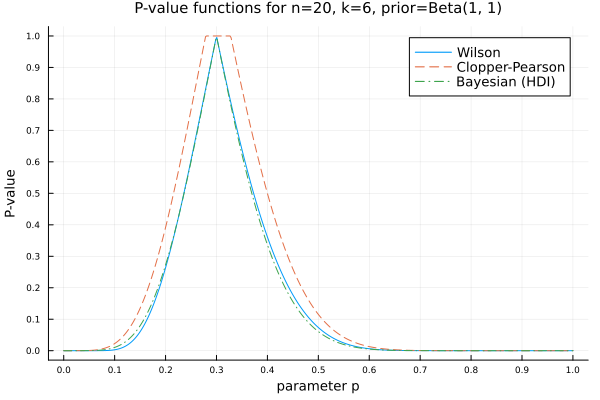

In [17]:
plot_pvalue_functions_hdi(; n=20, k=6, γ=1, δ=1)

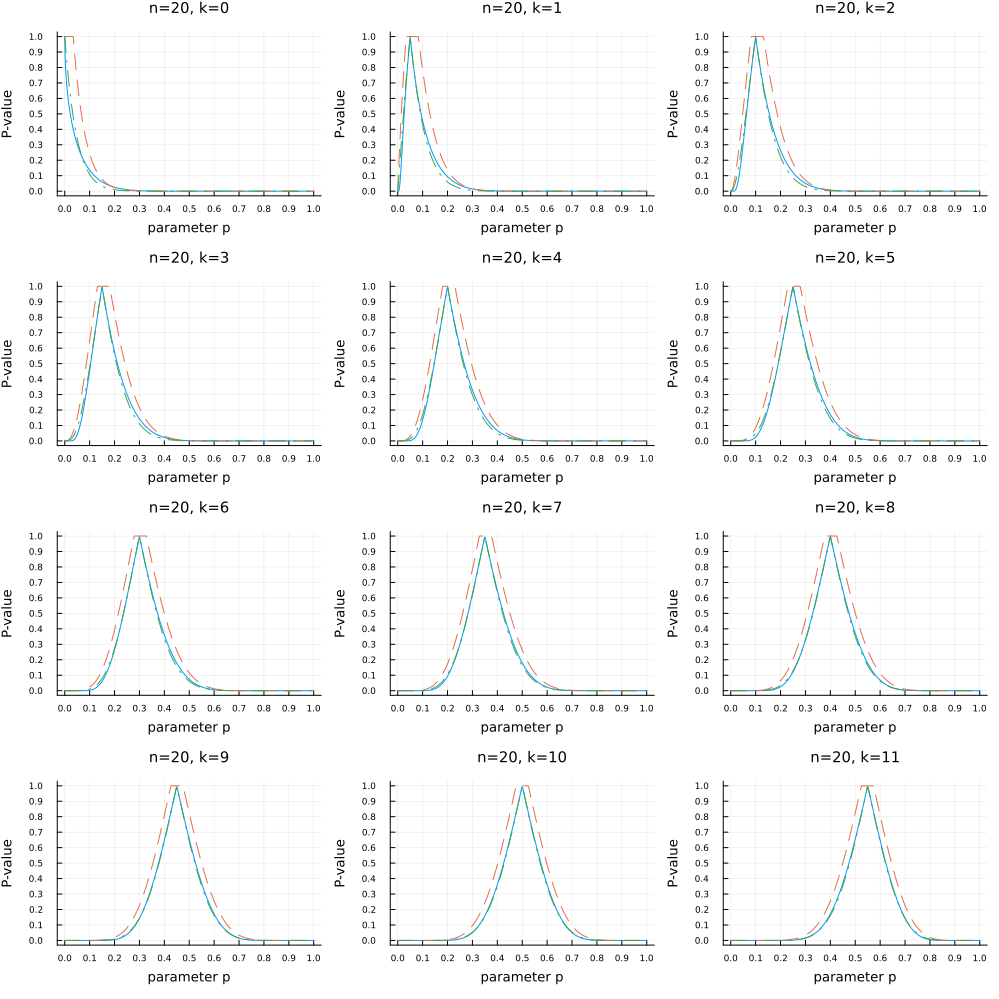

In [18]:
PP = []
for k in 0:11
    P = plot_pvalue_functions_hdi(; n=20, k, γ=1, δ=1, title="n=$n, k=$k", legend=false)
    push!(PP, P)
end
plot(PP...; size=(1000, 1000), layout=(4, 3))
plot!(legend=false)

## 信頼区間にベイズ信用区間と同様の意味で「真の値」が含まれる確率

結構頻繁に次のようなことを言う人をみかける:

* 95%信頼区間に真の値が含まれる確率が95%になると考えるのは誤解であるが, ベイズ統計における95%信用区間であれば真の値が95%の確率で含まれると考えてよい.

事後分布にしたがってランダムに生成されたパラメータ値 $p$ が95%ベイズ信用区間に含まれる確率は95%になる.  これが「ベイズ統計における95%信用区間であれば真の値が95%の確率で含まれる」の正確な内容である.

すなわち, 「ベイズ統計における95%信用区間であれば真の値が95%の確率で含まれる」における「真の値」は統計分析において真に興味がある現実における何かの値ではなく, 数学的フィクションである統計モデルの条件付き確率分布として定義される事後分布で生成された値に過ぎない.

「ベイズ統計における95%信用区間であれば真の値が95%の確率で含まれる」という発言を目にして, 「これこそ, 私が欲しかった性質である. 信頼区間よりもベイズ信用区間の方が解釈がわかりやすいし, 優れている!」のように思った人は, 過剰広告に騙されていることになる.

一様事前分布に関する事後分布については「事後分布にしたがってランダムに生成されたパラメータ値 $p$ が含まれる確率は95%になる」という性質は95%信頼区間についても近似的に成立している.  (注意: 実際には一様事前分布の場合に限らず, おとなしめの任意の事前分布についても同様である.)

そのことを以下で数値的に確認しよう.

In [19]:
# Wilsonの信頼区間
function confint_bin_wilson(k; n=20, α=0.05)
    z = cquantile(Normal(0,1), α/2)
    p̂ = k/n
    a, b, c = 1 + z^2/n, p̂ + z^2/(2n), p̂^2
    sqrtD = √(b^2 - a*c)
    (b - sqrtD)/a, (b + sqrtD)/a
end

# 事後分布で測ったWilsonの信頼区間にpが含まれる確率
function prob_of_p_in_ci_wrt_posterior(k; n=20, α=0.05, γ=1, δ=1)
    beta = Beta(k+γ, n-k+δ)
    p_L, p_U = confint_bin_wilson(k; n, α)
    cdf(beta, p_U) - cdf(beta, p_L)
end

# 事後分布で測ったWilsonの信頼区間にpが含まれる確率のプロット
function plot_prob_of_p_in_ci_wrt_posterior(; n=20, α=0.05, γ=1, δ=1, kwargs...)
    ks = 0:n
    probs = prob_of_p_in_ci_wrt_posterior.(ks; n, α, γ, δ)

    plot(ks, probs; label="")
    hline!([1-α]; label="", ls=:dash)
    plot!(ylim=(1-2α, 1+α/25))
    plot!(xtick=0:n, ytick=0:α/5:1)
    plot!(xguide="k", yguide="probability")
    title!("prob. of p ∈ 95% conf. int. w.r.t. posterior for n=$n, prior=Beta($γ, $δ)")
    plot!(; kwargs...)
end

plot_prob_of_p_in_ci_wrt_posterior (generic function with 1 method)

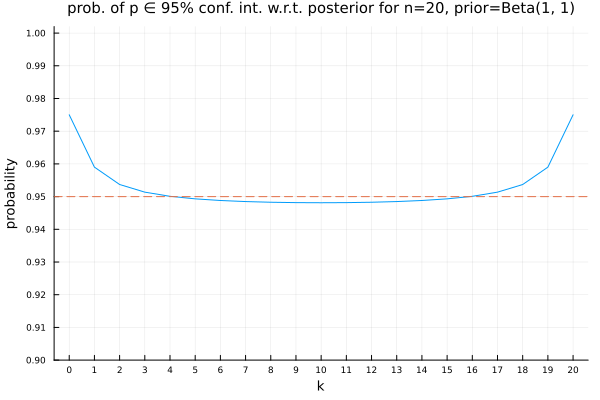

In [20]:
plot_prob_of_p_in_ci_wrt_posterior(; n=20)

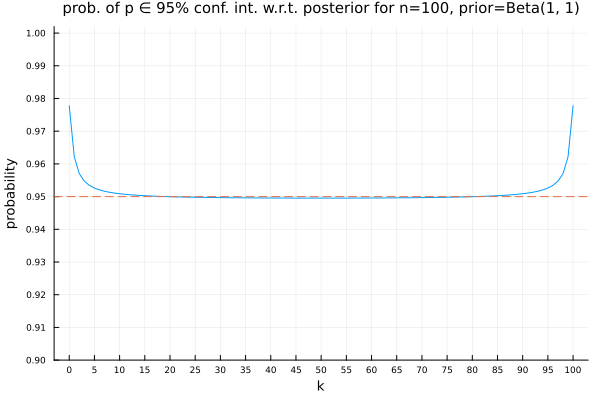

In [21]:
plot_prob_of_p_in_ci_wrt_posterior(; n=100, xtick=0:5:100)

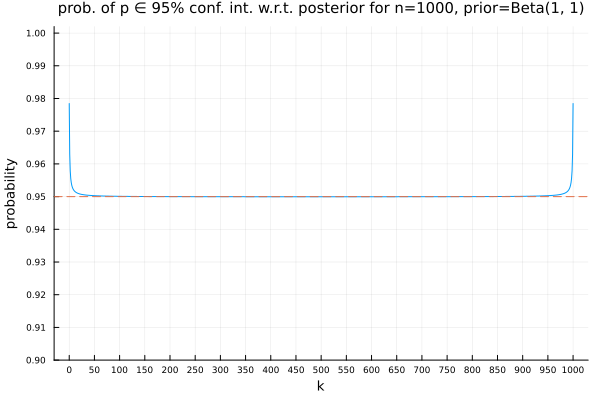

In [22]:
plot_prob_of_p_in_ci_wrt_posterior(; n=1000, xtick=0:50:1000)

このように一様事前分布から得られる事後分布で測った95%信頼区間(Wilson)に含まれる確率は95%でよく近似されている.

ただし, $k/n$ または $1-k/n$ が小さ過ぎる場合にはその確率は95%よりも大きめになることには注意が必要である.

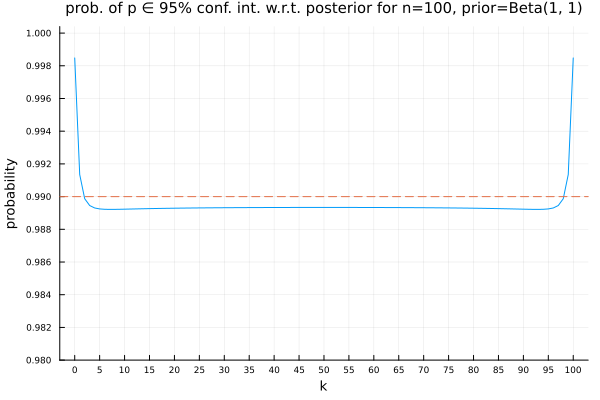

In [23]:
plot_prob_of_p_in_ci_wrt_posterior(; n=100, xtick=0:5:100, α=0.01)

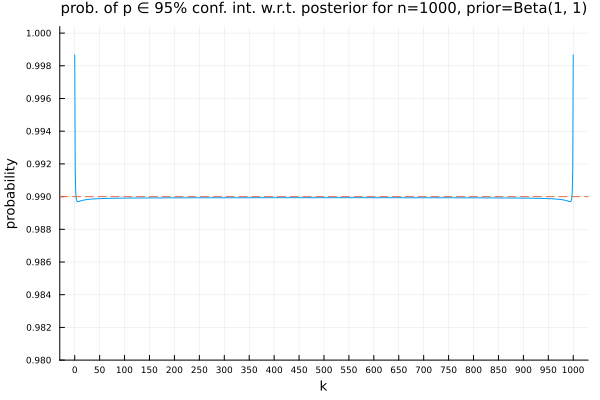

In [24]:
plot_prob_of_p_in_ci_wrt_posterior(; n=1000, xtick=0:50:1000, α=0.01)

## ベイズ信用区間の信頼区間と同様の意味での被覆確率

前節と逆に, ベイズ信用区間の信頼区間と同様の意味での被覆確率を計算してみよう.

In [25]:
# 二項分布モデルでの被覆確率
# 引数として函数 pvalue(k, p, n) を与える.
function coverage_probability(pvalue, p; n=20, α=0.05)
    bin = Binomial(n, p)
    μ, σ = mean(bin), std(bin)
    kmin, kmax = max(0, round(Int, μ-5σ)), min(round(Int, μ+5σ), n)
    supp = kmin:kmax
    sum(0:n) do k
        (pvalue(k, p, n) ≥ α) * pdf(bin, k)
    end
end

# 被覆確率をプロット
function plot_coverage_probability(pvalue; n=20, α=0.05)
    p = range(0, 1, round(Int, 100√n))
    P0 = plot(p, p -> coverage_probability(pvalue, p; n, α); label="")
    hline!([1-α]; label="", ls=:dash)
    plot!(xtick=0:0.1:1, ytick=0:α/5:1)
    plot!(xguide="p", yguide="coverage probability")
    plot!(ylim=(1-2α, 1+α/25))
end

function plot_coverage_probabilities(; n=20, α=0.05, γ=1, δ=1)
    pvalue0(k, p, n) = pvalue_bin_wilson(k, p; n)
    pvalue1(k, p, n) = pvalue_bin_bayesian_hdi(k, p; n, γ, δ)

    P0 = plot_coverage_probability(pvalue0; n, α)
    title!("Wilson's confidence interval for n=$n, α=$α")

    P1 = plot_coverage_probability(pvalue1; n, α)
    title!("Bayesian cred int. for n=$n, α=$α, prior=Beta($γ,$δ)")

    plot(P0, P1; size=(1000, 300))
    plot!(leftmargin=4Plots.mm, bottommargin=4Plots.mm)
end

plot_coverage_probabilities (generic function with 1 method)

  0.361082 seconds (956.97 k allocations: 50.061 MiB, 81.10% compilation time)


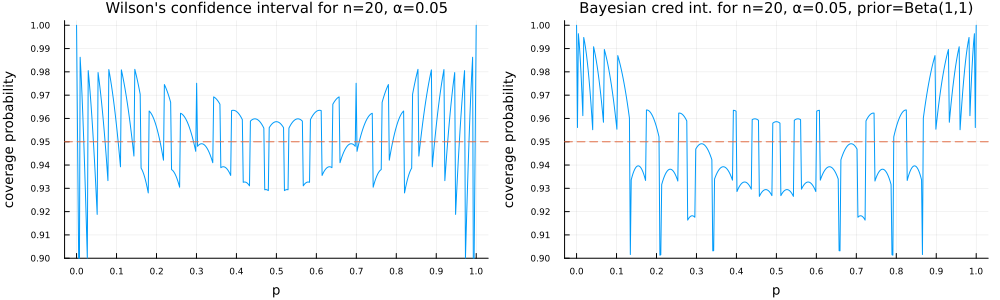

In [26]:
@time plot_coverage_probabilities(n = 20)

  0.721353 seconds (29.32 k allocations: 7.656 MiB)


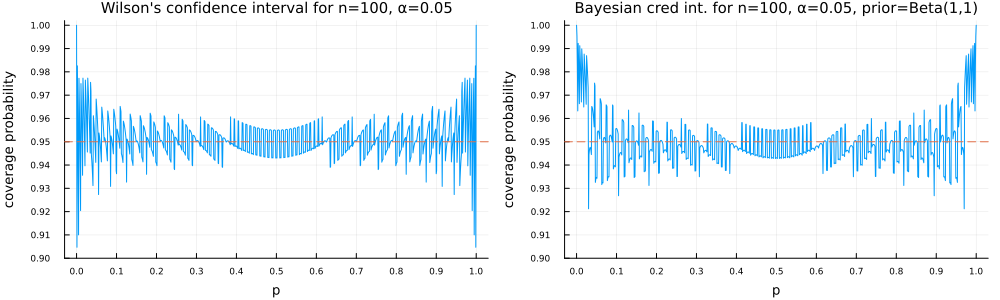

In [27]:
@time plot_coverage_probabilities(n = 100)

 18.613435 seconds (585.55 k allocations: 146.729 MiB, 0.12% gc time)


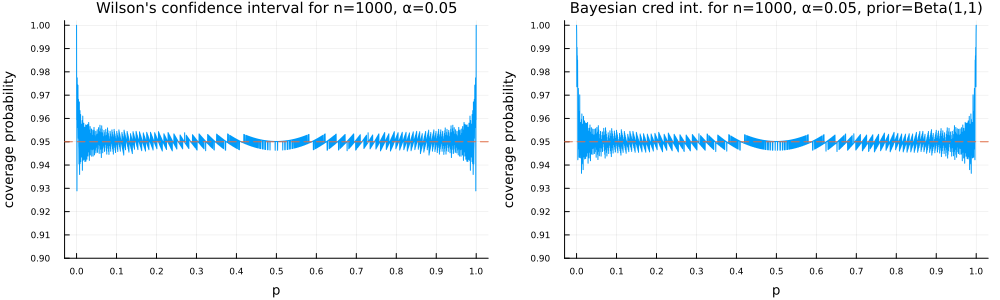

In [28]:
@time plot_coverage_probabilities(n = 1000)

ベイズ信用区間(平坦事前分布に関するhighest density版)の被覆確率は通常の信頼区間(Wilson版)の被覆確率とそう変わらないことが分かった.

ベイズ信用区間も通常の信頼区間も $k/n$ または $1-k/n$ が小さ過ぎる場合の被覆確率の $1-\alpha$ からのずれについては注意した方が良いかもしれない.

  0.716682 seconds (29.30 k allocations: 7.655 MiB)


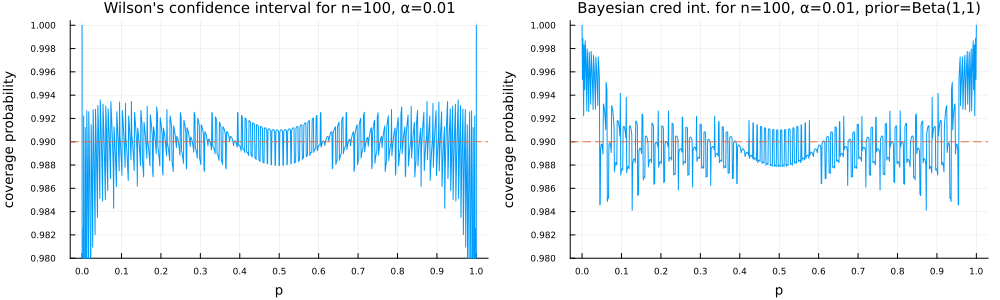

In [29]:
@time plot_coverage_probabilities(n = 100, α = 0.01)

 18.634377 seconds (585.54 k allocations: 146.728 MiB, 0.20% gc time)


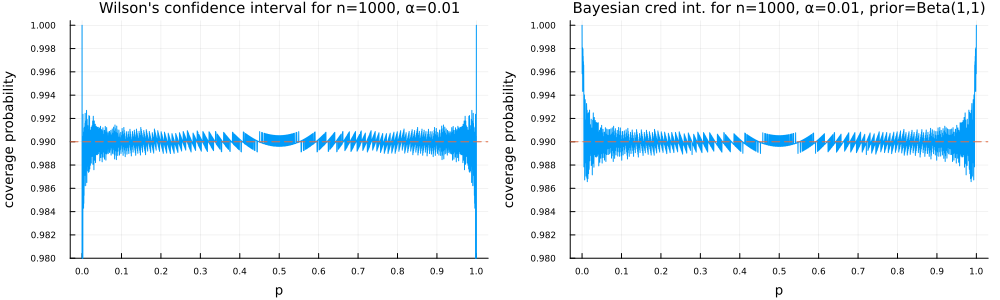

In [30]:
@time plot_coverage_probabilities(n = 1000, α = 0.01)

  0.185155 seconds (223.61 k allocations: 11.978 MiB, 58.84% compilation time)


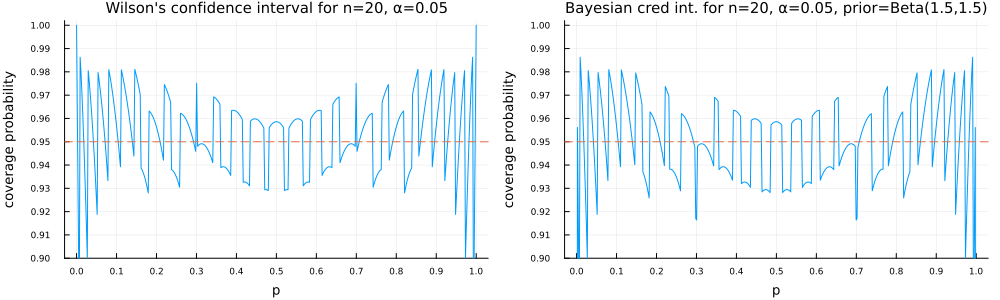

In [31]:
@time plot_coverage_probabilities(n = 20, γ = 1.5, δ = 1.5)

  0.819319 seconds (28.36 k allocations: 7.383 MiB, 2.39% gc time)


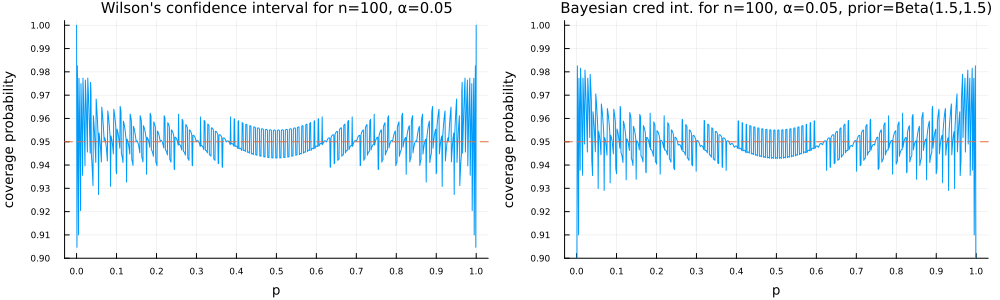

In [32]:
@time plot_coverage_probabilities(n = 100, γ = 1.5, δ = 1.5)

 18.611485 seconds (516.55 k allocations: 126.692 MiB, 0.10% gc time)


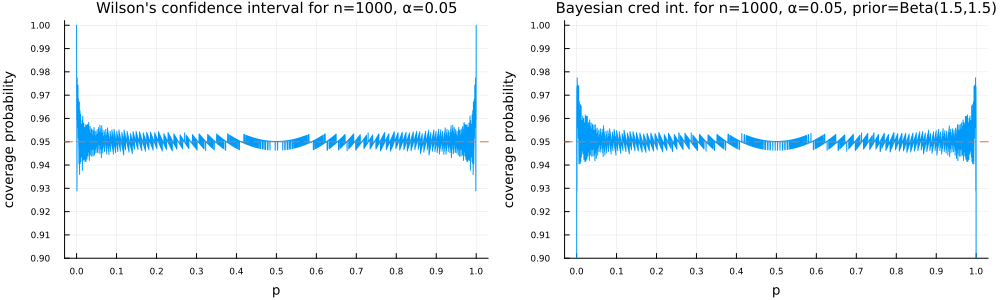

In [33]:
@time plot_coverage_probabilities(n = 1000, γ = 1.5, δ = 1.5)

## P値とBayes因子の比較

以上では, P値と事前分布のそれぞれから作られる信頼区間とBayes信用区間を比較して, 互いに相手を近似する関係になっていることを示した.

以下では, P値とBayes因子を比較してみよう.

P値とBayes因子のあいだには近似的な変換関係があり, P値を使った方法はBayes因子を使った方法に翻訳可能であり, 逆向きの翻訳も可能である.

### P値とBayes因子の関係の導出

二項分布モデルでのWilsonのP値と一様事前分布と $p$ に台を持つデルタ事前分布のBayes因子のあいだの近似的な変換関係を導出しよう.

仮説「成功確率は $p$ である」を考え, データの数値「$n$ 回中 $k$ 回成功」が与えられているとしよう.

$$
z = \frac{k - np}{\sqrt{np(1-p)}}.
$$

とおく. このとき,

$$
z^2 = \frac{(k - np)^2}{np(1-p)}.
$$

WilsonのP値は次のように定義される:

$$
\pvalue(k|n,p) = 2(1 - \cdf(\op{Normal}(0,1), |z|)).
$$

このとき,

$$
\op{pval} = \pvalue(k|n,p)
\iff
|z| = \quantile(\op{Normal}(0,1), 1-\op{pval}/2).
$$


$p$ に台を持つデルタ事前分布の周辺尤度 $Z_0$ は成功確率が $p$ の二項分布モデルの尤度に等しい:

$$
Z_0 = \binom{n}{k} p^k (1 - p)^{n-k}.
$$

$k$ が $np$ に近ければ中心極限定理によってこれは次のように近似される:

$$
Z_0 \approx \frac{1}{\sqrt{2\pi np(1-p)}}\exp(-z^2/2).
$$

一様事前分布の周辺尤度 $Z_1$ は次のように定義され, 計算される:

$$
Z_1 = \int_0^1 \binom{n}{k} t^k (1 - t)^{n-k}\,dt =
\binom{n}{k}B(k+1, n-k+1) = \frac{n!}{k!(n-k)!} \frac{k!(n-k)!}{(n+1)!} = \frac{1}{n+1}.
$$

Bayes因子 $\op{BF}$ を次のように定義する:

$$
\op{BF} = \frac{Z_0}{Z_1}.
$$

これは次のように近似される:

$$
\op{BF} \approx \frac{n+1}{\sqrt{2\pi np(1-p)}}\exp(-z^2/2).
$$

これに $z^2 = \quantile(\op{Normal}(0,1), 1-\op{pval}/2)^2$ を適用すればP値 $\op{pval}$ に近似的に対応するBayes因子の値が得られる.

さらに上の近似は次の近似的等式と同値である:

$$
z^2 \approx -2\log\op{BF} + \log\frac{(n+1)^2}{n} - \log(2\pi p(1-p)).
$$

この近似を $\op{pval} = 2\left(1 - \cdf\left(\op{Normal}(0,1), \sqrt{z^2}\right)\right)$ に適用すれば, Bayes因子の値 $\op{BF}$ に近似的に対応するP値が得られる.

$z^2$ が大きなほど対応するP値は小さくなるので, 同一のBayes因子 $\op{BF}$ の値に近似的に対応するP値は $n$ について単調減少函数になる.

このことから, Bayes因子を使ったBayes検定は $n$ が大きなほど保守的な検定になることがわかる.

ゆえに, Bayes検定ではその分だけ検出力は下がることになる.

In [34]:
# log Bayes factor for the uniform prior
function log_bayes_factor(k, p; n=20)
    logZ1 = -log(n+1)
    logZ0 = logpdf(Binomial(n, p), k)
    logZ0 - logZ1
end

# Bayes factor for the uniform prior
bayes_factor(k, p; n=20) = exp(log_bayes_factor(k, p; n))

# Bayes factorのP値への近似的変換
function bf2pval(BF, p; n=20)
    z² = max(0, -2log(BF) + log((n+2)^2/n) - log(2π*p*(1-p)))
    2ccdf(Normal(), √z²)
end

# Bayes factor経由で計算したP値
pvalue_bin_bf(k, p; n=20) = bf2pval(bayes_factor(k, p; n), p; n)

# P値のBayes factorへの近似的変換
function pval2bf(pval, p; n=20)
    z = quantile(Normal(), 1 - pval/2)
    neg2logBF = z^2 - log((n+1)^2/n) + log(2π*p*(1-p))
    exp(-neg2logBF/2)
end

pval2bf (generic function with 1 method)

### Bayes factor経由で計算したP値と通常のP値の比較

In [35]:
function plot_pvalue_function_bf(; n = 20, k = 6, kwargs...)
    p = range(0, 1, 1000)
    plot(p, p -> pvalue_bin_bf(k, p; n);
        label="P-values via Bayes factor")
    plot!(p, p -> pvalue_bin_wilson(k, p; n); ls=:dash,
        label="Wilson's P-value function")
    plot!(xtick=0:0.1:1, ytick=0:0.05:1)
    title!("n=$n, k=$k")
    plot!(; kwargs...)
end

plot_pvalue_function_bf (generic function with 1 method)

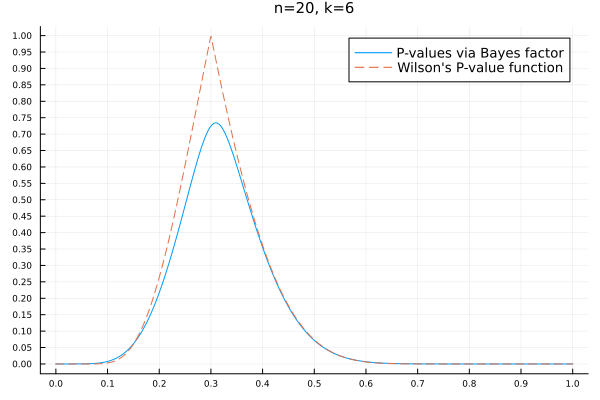

In [36]:
plot_pvalue_function_bf(n = 20, k = 6)

値が小さな部分で通常のWilsonのP値とBayes因子経由で計算したP値はほぼ一致している.

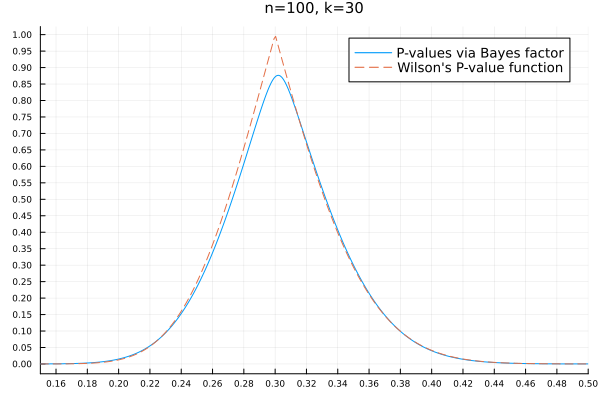

In [37]:
plot_pvalue_function_bf(n = 100, k = 30, xlim=(0.15, 0.5), xtick=0:0.02:1)

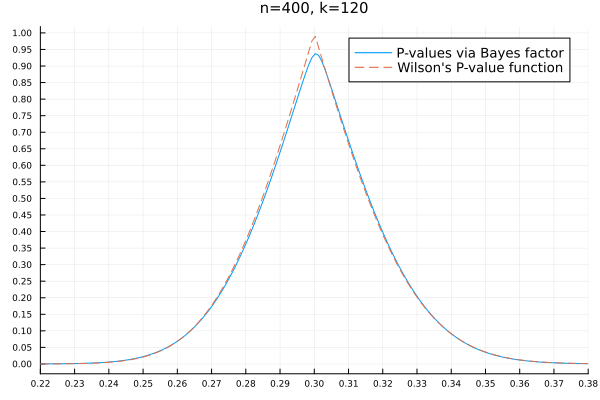

In [38]:
plot_pvalue_function_bf(n = 400, k = 120, xlim=(0.22, 0.38), xtick=0:0.01:1)

$n$ と $k$ を大きくすると, 値が小さくない部分でもWilsonのP値とBayes因子経由で計算したP値はほぼ一致するようになる.

### 一定のBayes因子に対応するP値の値の漸近挙動

In [39]:
function plot_bf2pval(BF, p;
        nmin=10, nstep=1, nmax=1000, xtick=0:100:1000, kwargs...)
    n = nmin:nstep:nmax
    plot(n, n -> bf2pval(BF, p; n); label="")
    plot!(xguide="$nmin ≤ n ≤ $nmax", yguide="P-value")
    title!("P-values corresponding to BF = $BF, p = $p")
    plot!(leftmargin=4Plots.mm, bottommargin=4Plots.mm)
    plot!(; xtick, kwargs...)
end

plot_bf2pval (generic function with 1 method)

以下のように, 同一のBayes因子の値に近似的に対応するP値は $n$ について単調減少函数になる.

ゆえに, Bayes因子を使ったBayes検定は $n$ が大きいほど保守的な検定になり, 検出力は下がる.

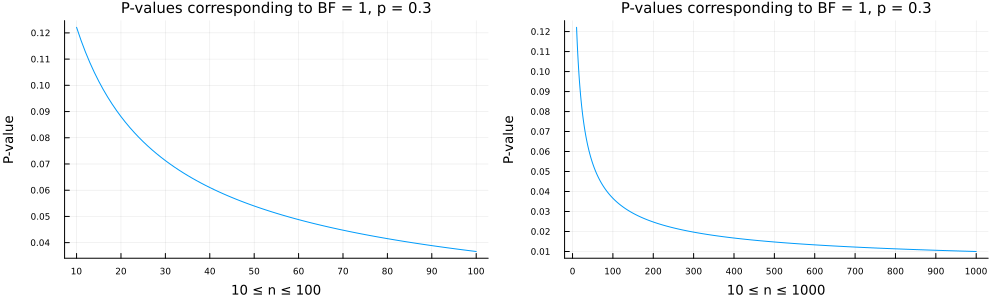

In [40]:
P1 = plot_bf2pval(1, 0.3; ytick=0:0.01:1, nmin=10, nstep=1, nmax=100, xtick=10:10:100)
P2 = plot_bf2pval(1, 0.3; ytick=0:0.01:1)
plot(P1, P2; size=(1000, 300))

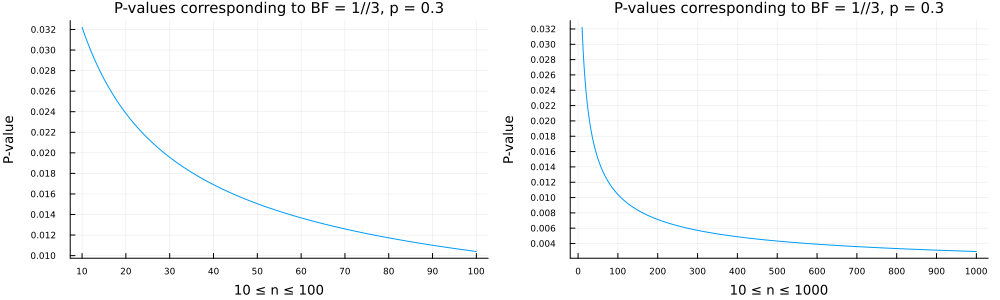

In [41]:
P1 = plot_bf2pval(1//3, 0.3; ytick=0:0.002:1, nmin=10, nstep=1, nmax=100, xtick=10:10:100)
P2 = plot_bf2pval(1//3, 0.3; ytick=0:0.002:1)
plot(P1, P2; size=(1000, 300))

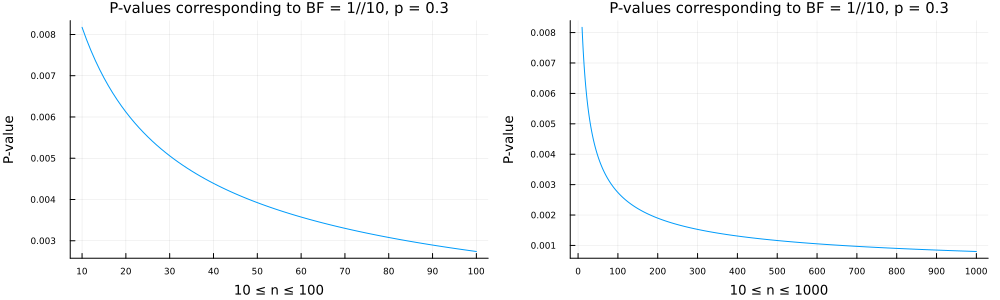

In [42]:
P1 = plot_bf2pval(1//10, 0.3; ytick=0:0.001:1, nmin=10, nstep=1, nmax=100, xtick=10:10:100)
P2 = plot_bf2pval(1//10, 0.3; ytick=0:0.001:1)
plot(P1, P2; size=(1000, 300))

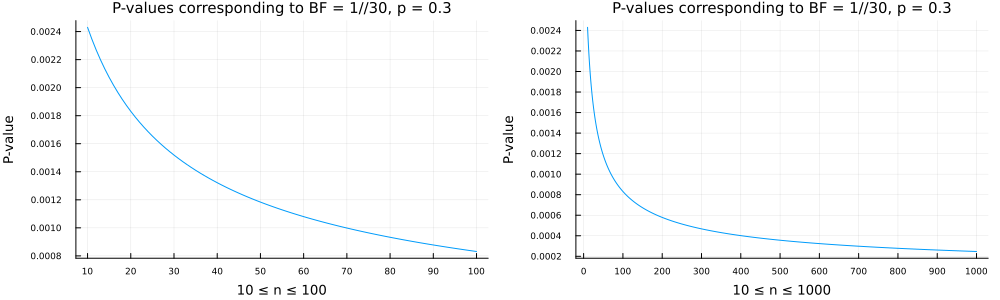

In [43]:
P1 = plot_bf2pval(1//30, 0.3; ytick=0:0.0002:1, nmin=10, nstep=1, nmax=100, xtick=10:10:100)
P2 = plot_bf2pval(1//30, 0.3; ytick=0:0.0002:1)
plot(P1, P2; size=(1000, 300))

### 一般の事前分布の場合に関する補足

$$
\hat{p} = k/n
$$

とおく. $n\to\infty$ で $\hat{p}$ の値はほぼ一定であると仮定する(そういう設定で考える).

Wald法では二項分布の確率について次の近似を使う:

$$
\binom{n}{k} t^k(1-t)^{n-k}
\approx
\frac{1}{\sqrt{2\pi n\hat{p}(1-\hat{p})}} \exp\left(\frac{(t-\hat{p})^2}{2\hat{p}(1-\hat{p})/n}\right).
$$

事前分布 $\varphi(t)$ の周辺尤度は

$$
Z = \int_0^1 \binom{n}{k} t^k (1 - t)^{n-k} \varphi(t)\,dt
$$

である.  これに上の近似を適用すると,

$$
\begin{aligned}
Z
&\approx
\frac{1}{\sqrt{2\pi n\hat{p}(1-\hat{p})}}
\int_{-\infty}^\infty \exp\left(\frac{(t-\hat{p})^2}{2\hat{p}(1-\hat{p})/n}\right) \varphi(t)\,dt
\\
&\approx
\frac{\varphi(\hat{p})}{\sqrt{2\pi n\hat{p}(1-\hat{p})}}
\int_{-\infty}^\infty \exp\left(\frac{(t-\hat{p})^2}{2\hat{p}(1-\hat{p})/n}\right) \,dt
\\
&=
\frac{\varphi(\hat{p})}{\sqrt{2\pi n\hat{p}(1-\hat{p})}} \sqrt{\frac{2\pi\hat{p}(1-\hat{p})}{n}}
\\
&=
\frac{\varphi(\hat{p})}{n}.
\end{aligned}
$$

例えば, 一様事前分布 $\varphi(t)=1$ ($0\le t\le 1$) の場合には,

$$
Z_1 = \frac{1}{n+1} = \frac{\varphi(\hat{p})}{n+1} \approx \frac{\varphi(\hat{p})}{n}
$$

なので, 確かに上の近似は成立している(分母の $n+1$ と $n$ の違いしかない).

事前分布 $\varphi(t)$ が $t=\hat{p}$ で $0$ になる場合には, $n\to\infty$ のとき, 周辺尤度は $O(1/n)$ のオーダーよりも速く $0$ に収束することに注意せよ. 